In [104]:
!pip install plotly

In [105]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import numpy as np

In [106]:
data = pd.read_csv("queryResult", delimiter="\t", low_memory = False)

In [107]:
initialShape =data.shape
initialLength = initialShape[0]
initialLength

108897

In [108]:
data.head(30)

,@id,@type,@lat,@lon,public_transport,highway,railway,station,historic,amenity,leisure,shop,name
0,30326364,node,60.457508,22.233555,NaN,NaN,NaN,NaN,NaN,NaN,NaN,supermarket,S-market Manhattan
1,42432939,node,40.814104,-73.949623,stop_position,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,42435763,node,40.804425,-73.955366,NaN,NaN,NaN,NaN,yes,NaN,NaN,NaN,NaN
3,42435844,node,40.816502,-73.946546,NaN,traffic_signals,NaN,NaN,yes,NaN,NaN,NaN,NaN
4,42443092,node,40.799577,-73.935898,NaN,traffic_signals,NaN,NaN,yes,NaN,NaN,NaN,NaN
5,42443336,node,40.777426,-73.978801,NaN,traffic_signals,NaN,NaN,yes,NaN,NaN,NaN,9th & 72nd St El 1881
6,42448838,node,40.761656,-73.949879,stop_position,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,42450071,node,40.797939,-73.940027,NaN,traffic_signals,NaN,NaN,yes,NaN,NaN,NaN,116th & 3rd
8,100515086,node,40.753080,-73.976995,stop_position,NaN,buffer_stop,NaN,NaN,NaN,NaN,NaN,Grand Central Terminal
9,121749625,node,39.183073,-96.555396,stop_position,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [109]:
data.columns

Index(['@id', '@type', '@lat', '@lon', 'public_transport', 'highway',
       'railway', 'station', 'historic', 'amenity', 'leisure', 'shop', 'name'],
      dtype='object')

In [110]:
data = data.drop_duplicates()

In [111]:
duplicatesShape= data.shape
duplicatesLength = duplicatesShape[0]
differenceWithInit = initialLength - duplicatesLength
print("Record difference from initial phase : \t" + str(differenceWithInit) )

Record difference from initial phase : 	0


# MISSING VALUES

In [112]:
data = data.dropna(subset=["public_transport", "highway", "railway", "station", "historic", "amenity", "leisure", "shop", "name"],how="all")

In [113]:
missingValueShape= data.shape
missingValueLength = missingValueShape[0]
differenceWithInit = initialLength - missingValueLength
differenceWithPrevious = duplicatesLength - missingValueLength
print("Record difference from initial phase : \t" + str(differenceWithInit) )
print("Record difference from previous phase :\t" + str(differenceWithInit) )

Record difference from initial phase : 	80715
Record difference from previous phase :	80715


# OUTLIERS

In [114]:
data = data.drop(data[(data.historic == "yes") | (data.leisure == "user defined") | (data.amenity == "yes")
                     | (data.amenity == "user defined")| (data.railway == "yes") |(data.shop == "yes")].index)

In [115]:
outliersShape= data.shape
outliersLength = outliersShape[0]
differenceWithInit = initialLength - outliersLength
differenceWithPrevious = missingValueLength - outliersLength
print("Record difference from initial phase : \t" + str(differenceWithInit) )
print("Record difference from previous phase :\t" + str(differenceWithPrevious) )

Record difference from initial phase : 	80833
Record difference from previous phase :	118


# FREQUENCY COUNT

### TYPE OF ELEMENTS

In [116]:
data["@type"] = data["@type"].str.lower()
data["@type"].value_counts()

node        22235
way          5750
relation       79
Name: @type, dtype: int64

In [117]:
data["@type"].describe()

count     28064
unique        3
top        node
freq      22235
Name: @type, dtype: object

In [118]:
fig = px.histogram(data["@type"], x="@type")

fig.update_layout(title_text='Nodes Type')
fig.show()

/home/davide/.local/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



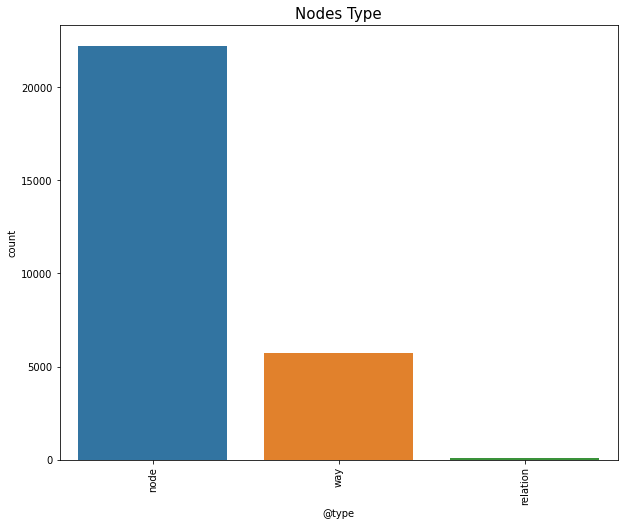

In [119]:
plt.figure(figsize=(10,8))
plt.title("Nodes Type", size = 15)
sns.countplot(data["@type"])
plt.xticks(rotation='vertical')
plt.show()

### PUBLIC TRANSPORT

In [120]:
data["public_transport"] = data["public_transport"].str.lower()
data["public_transport"].value_counts()

platform          1484
stop_position      875
station            180
service_center       2
Name: public_transport, dtype: int64

In [121]:
data["public_transport"].describe()

count         2541
unique           4
top       platform
freq          1484
Name: public_transport, dtype: object

In [122]:
fig = px.histogram(data["public_transport"], x="public_transport")
fig.show()

/home/davide/.local/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



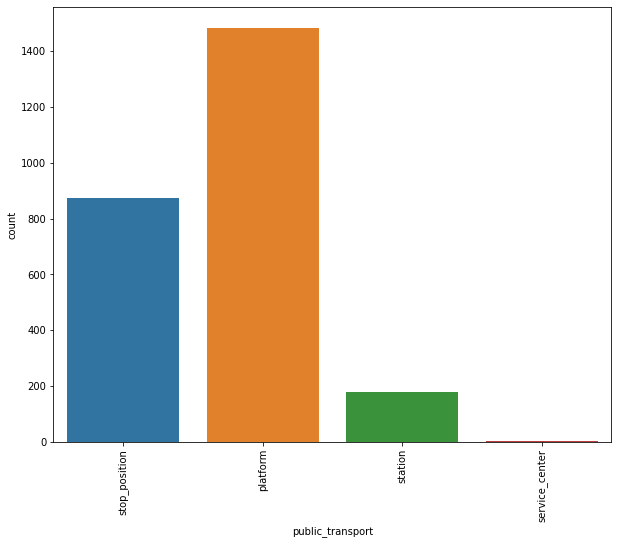

In [123]:
plt.figure(figsize=(10,8))
sns.countplot(data["public_transport"])
plt.xticks(rotation='vertical')
plt.show()

### HIGHWAY

In [124]:
data["highway"] = data["highway"].str.lower()
data["highway"].value_counts()

bus_stop       1490
pedestrian        5
service           2
track             1
street_lamp       1
Name: highway, dtype: int64

In [125]:
data["highway"].describe()

count         1499
unique           5
top       bus_stop
freq          1490
Name: highway, dtype: object

In [126]:
fig = px.histogram(data["highway"], x="highway")
fig.show()

/home/davide/.local/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



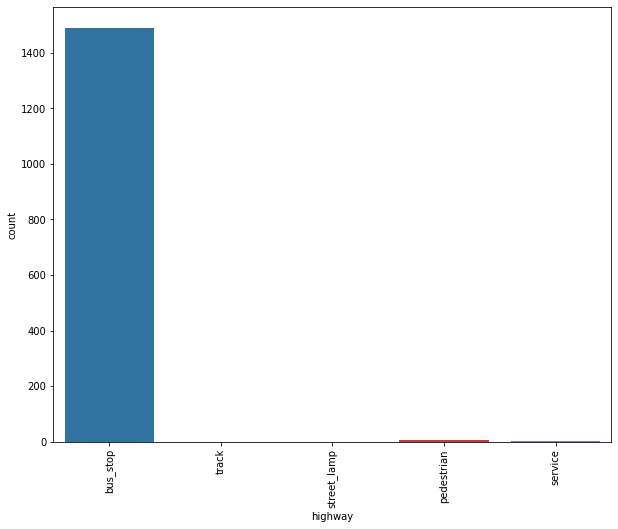

In [127]:
plt.figure(figsize=(10,8))
sns.countplot(data["highway"])
plt.xticks(rotation='vertical')
plt.show()

### RAILWAY

In [128]:
data["railway"] = data["railway"].str.lower()
data["railway"].value_counts()

stop           417
station        157
buffer_stop     52
Name: railway, dtype: int64

In [129]:
data["railway"].describe()

count      626
unique       3
top       stop
freq       417
Name: railway, dtype: object

In [130]:
fig = px.histogram(data["railway"], x="railway")
fig.show()

/home/davide/.local/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



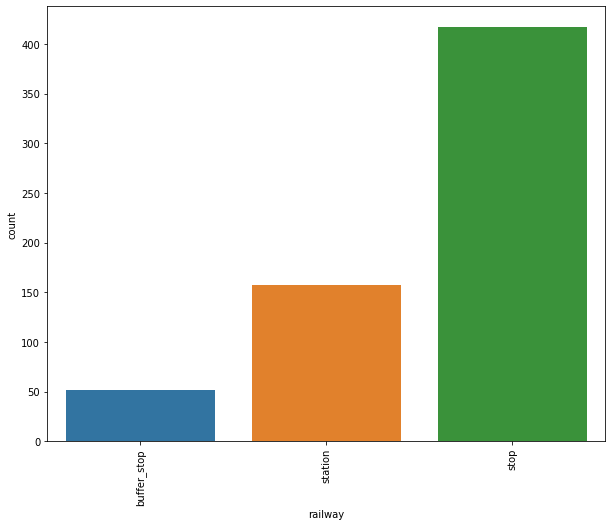

In [131]:
plt.figure(figsize=(10,8))
sns.countplot(data["railway"])
plt.xticks(rotation='vertical')
plt.show()

### STATION

In [132]:
data["station"] = data["station"].str.lower()
data["station"].value_counts()

subway    160
Name: station, dtype: int64

In [133]:
data["station"].describe()

count        160
unique         1
top       subway
freq         160
Name: station, dtype: object

In [134]:
fig = px.histogram(data["station"], x="station")
fig.show()

/home/davide/.local/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



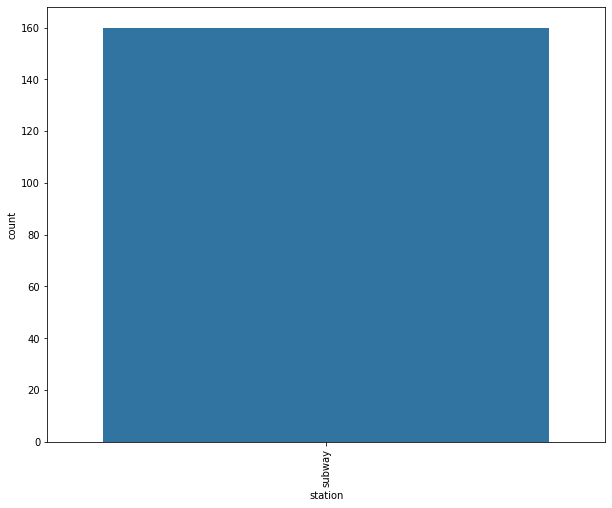

In [135]:
plt.figure(figsize=(10,8))
sns.countplot(data["station"])
plt.xticks(rotation='vertical')
plt.show()

### HISTORIC

In [136]:
data["historic"] = data["historic"].str.lower()
data["historic"].value_counts()

memorial                                                    119
monument                                                     44
building                                                     27
district                                                     25
aircraft                                                     23
ship                                                          8
cannon                                                        7
manor                                                         5
technical_monument                                            5
ruins                                                         5
fort                                                          3
house                                                         3
tomb                                                          2
theatre                                                       2
maritime                                                      2
bell                                    

In [137]:
data["historic"].describe()

count          291
unique          26
top       memorial
freq           119
Name: historic, dtype: object

In [138]:
fig = px.histogram(data["historic"], x="historic")
fig.show()

/home/davide/.local/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



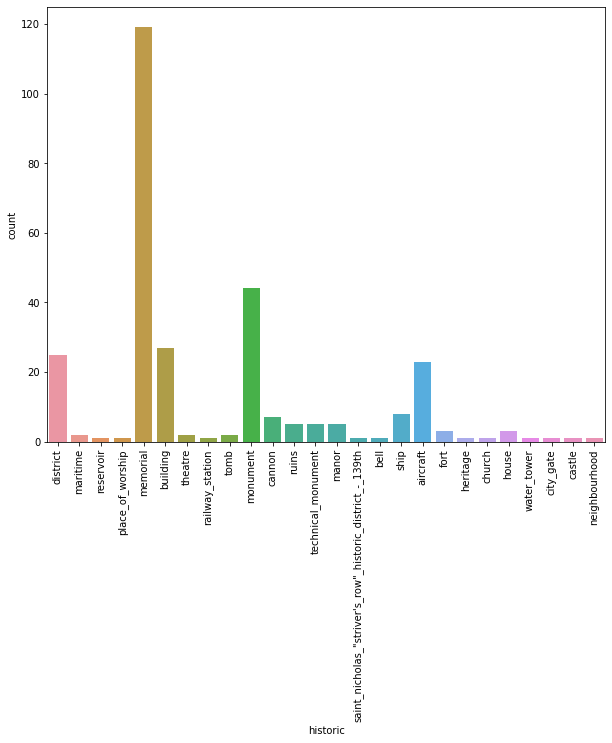

In [139]:
plt.figure(figsize=(10,8))
sns.countplot(data["historic"])
plt.xticks(rotation='vertical')
plt.show()

### AMENITY

In [140]:
data["amenity"] = data["amenity"].str.lower()
data["amenity"].value_counts()

bicycle_parking           3732
restaurant                2762
bench                     1586
parking                   1323
cafe                       931
                          ... 
airpump                      1
smoking_area                 1
research_institute           1
disused:pub                  1
waste_transfer_station       1
Name: amenity, Length: 126, dtype: int64

In [141]:
data["amenity"].describe()

count               17506
unique                126
top       bicycle_parking
freq                 3732
Name: amenity, dtype: object

In [142]:
fig = px.histogram(data["amenity"], x="amenity")
fig.show()

/home/davide/.local/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



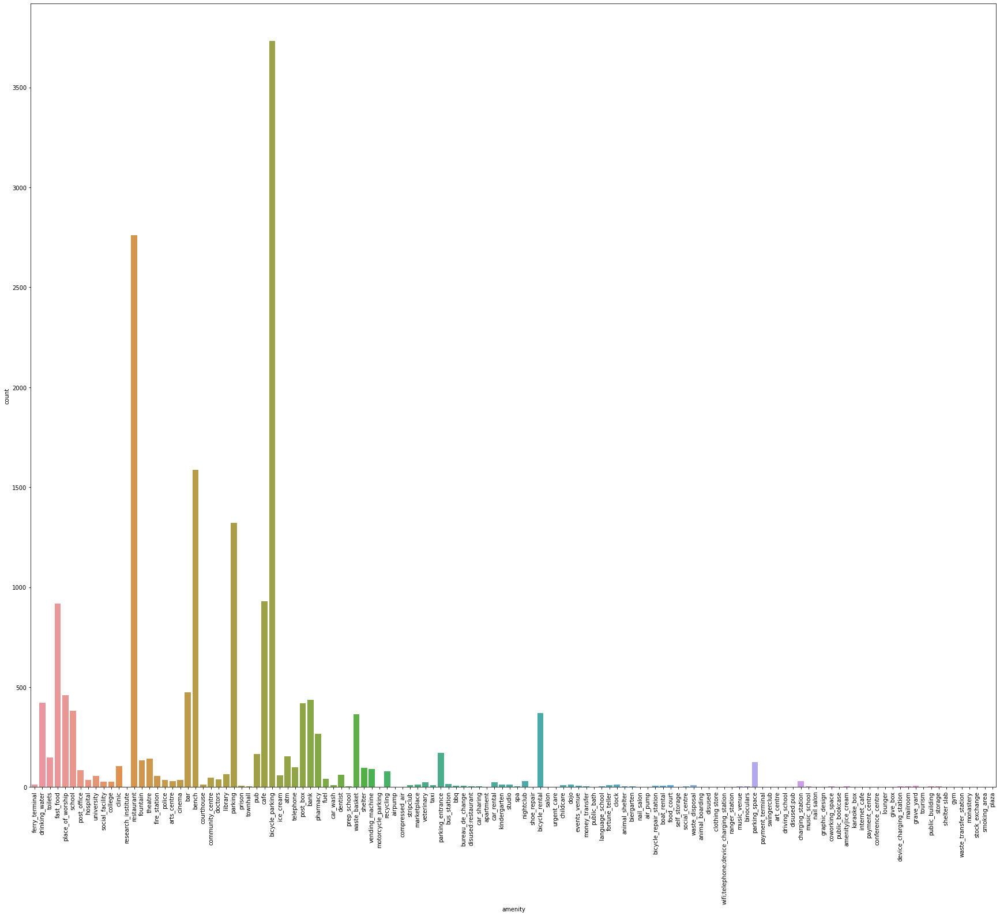

In [143]:
plt.figure(figsize=(30,25))
sns.countplot(data["amenity"])
plt.xticks(rotation='vertical')
plt.show()

### LEISURE

In [186]:
data["leisure"] = data["leisure"].str.lower()
data["leisure"].value_counts().sort_values(ascending=False)

garden                         884
pitch                          811
park                           469
playground                     337
picnic_table                   126
fitness_centre                 124
sports_centre                   64
swimming_pool                   61
outdoor_seating                 50
track                           41
dog_park                        31
bleachers                       11
dance                           10
ice_rink                        10
fitness_station                  9
stadium                          8
schoolyard                       7
amusement_arcade                 7
common                           5
miniature_golf                   4
marina                           4
slipway                          4
sauna                            3
bowling_alley                    3
golf_course                      3
escape_room                      2
recreation_ground                2
social_club                      2
water_park          

In [221]:
thres = 10
totSub = int(len(data["leisure"].value_counts(sort=True))/thres)
totSub

4

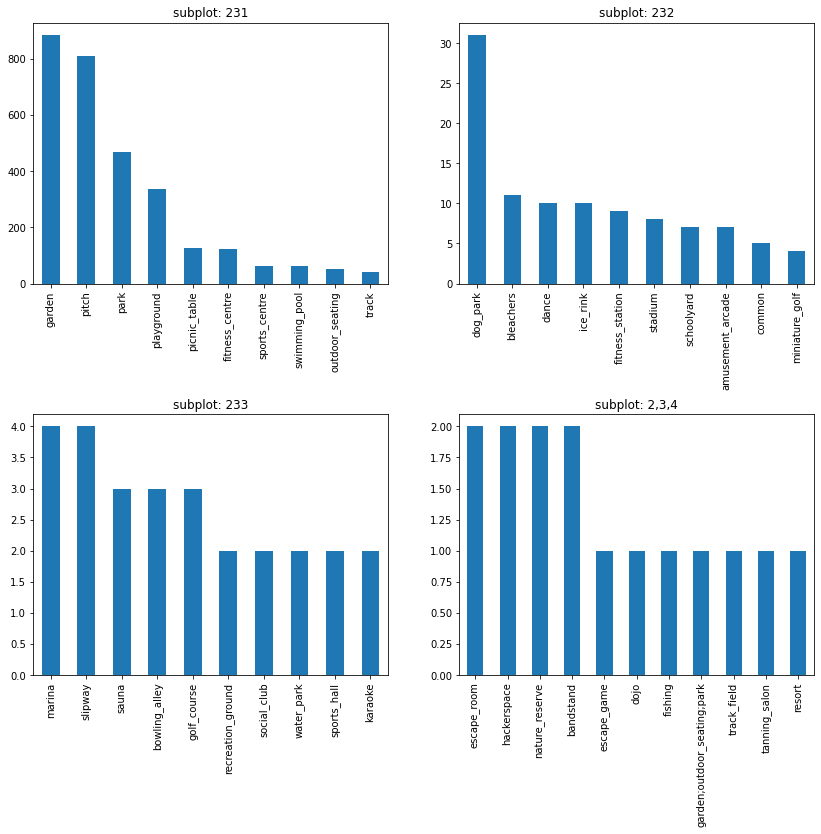

In [215]:
fig = plt.figure(figsize=(14,12))
fig.subplots_adjust(wspace=0.2)
fig.subplots_adjust(hspace=0.5)
#  subplot #1
plt.subplot(2,2,1)
plt.title('subplot: 231')
data['leisure'].value_counts(sort=True)[:10].plot.bar()


#  subplot #2
plt.subplot(2,2,2)
plt.title('subplot: 232')
data['leisure'].value_counts(sort=True)[10:20].plot.bar()


#  subplot #3
plt.subplot(2,2,3)
plt.title('subplot: 233')
data['leisure'].value_counts(sort=True)[20:30].plot.bar()


#  subplot #4
plt.subplot(2,2,4)
plt.title('subplot: 2,3,4')
data['leisure'].value_counts(sort=True)[30:41].plot.bar()




plt.show()


<AxesSubplot:>

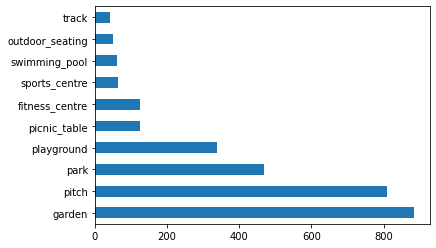

In [217]:
data['leisure'].value_counts(sort=True).nlargest(10).plot(kind = 'barh')

In [187]:
data["leisure"].describe()

count       3111
unique        41
top       garden
freq         884
Name: leisure, dtype: object

In [203]:
fig = px.histogram(data["leisure"], x="leisure")
fig.show()

/home/davide/.local/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



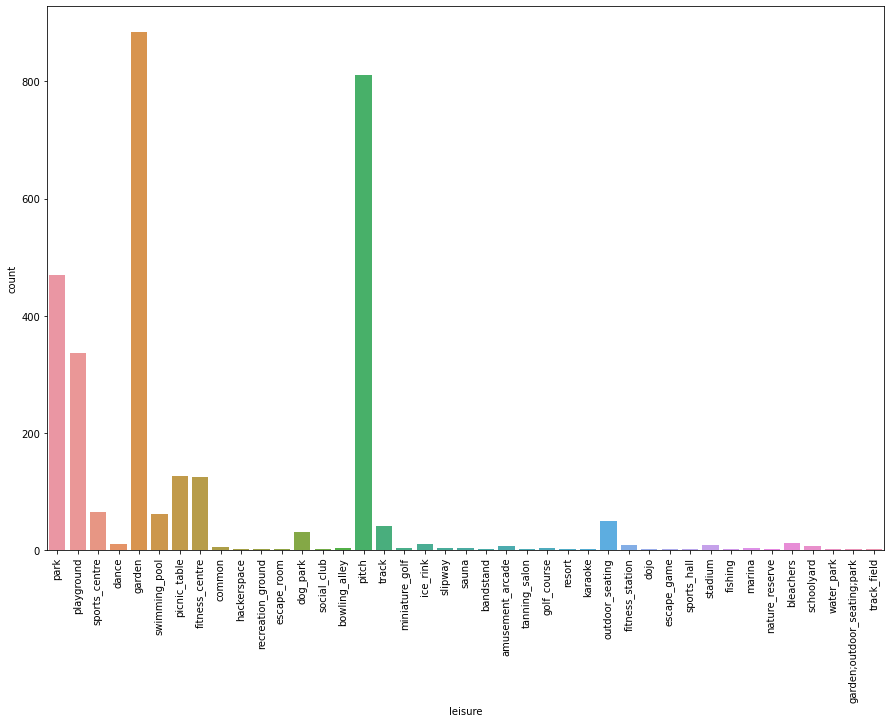

In [204]:
plt.figure(figsize=(15,10))
sns.countplot(data["leisure"])
plt.xticks(rotation='vertical')
plt.show()

### SHOP

In [151]:
data["shop"] = data["shop"].str.lower()
data["shop"].value_counts()

clothes         614
convenience     313
hairdresser     230
supermarket     229
alcohol         207
               ... 
grocery           1
sign              1
limo_service      1
comic_books       1
e-bicycle         1
Name: shop, Length: 190, dtype: int64

In [152]:
data["shop"] = data["shop"].str.lower()
data["shop"].value_counts(normalize=True)

clothes         0.130167
convenience     0.066356
hairdresser     0.048760
supermarket     0.048548
alcohol         0.043884
                  ...   
grocery         0.000212
sign            0.000212
limo_service    0.000212
comic_books     0.000212
e-bicycle       0.000212
Name: shop, Length: 190, dtype: float64

In [153]:
data["shop"].describe()

count        4717
unique        190
top       clothes
freq          614
Name: shop, dtype: object

/home/davide/.local/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



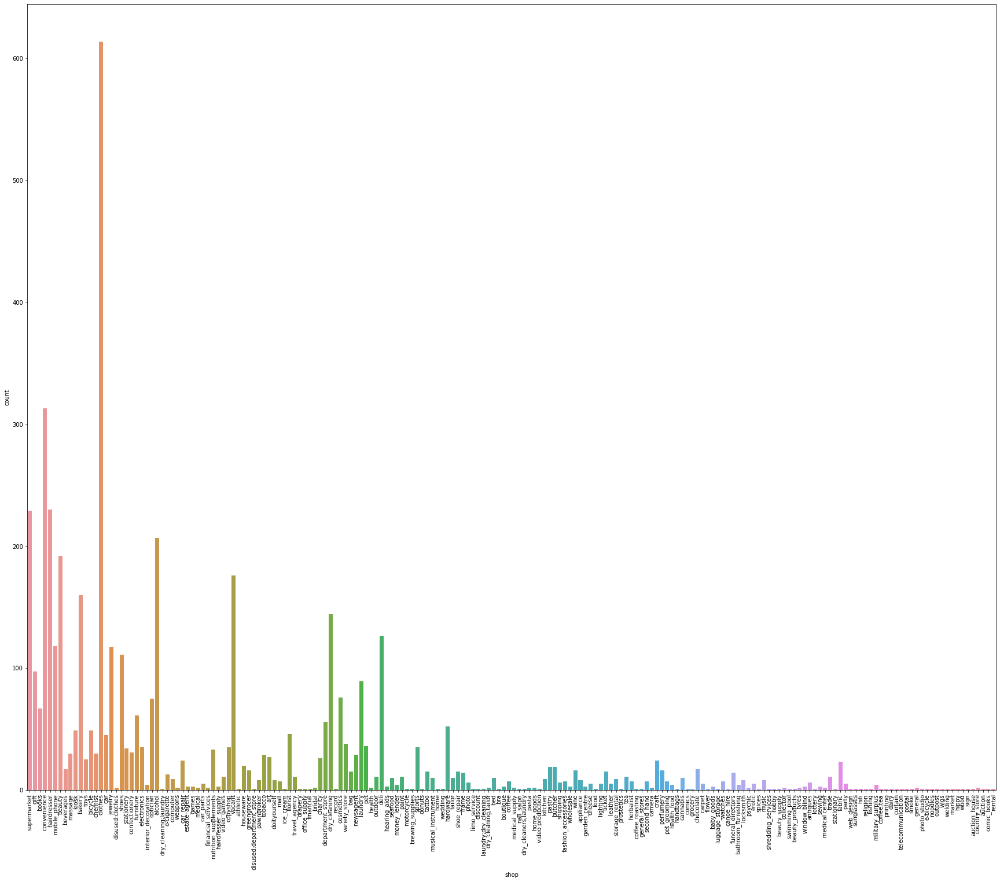

In [154]:
plt.figure(figsize=(30, 25))
sns.countplot(data["shop"])
plt.xticks(rotation='vertical')
plt.show()

In [155]:
import plotly.express as px
fig = px.histogram(data["shop"], x="shop")
fig.show()

# GEOGRAPHICAL VIEWS

In [156]:
fig = px.scatter_mapbox(data, lat="@lat", lon="@lon", color = "@type",
                  color_continuous_scale=px.colors.cyclical.IceFire, size_max=5, zoom=10,
                  mapbox_style="carto-positron")
fig.show()

In [157]:
leisureDf = pd.DataFrame(data, columns = ['@lat', '@lon', 'leisure'])
leisureDf = leisureDf.dropna()
leisureDf

,@lat,@lon,leisure
26,40.873155,-73.914025,park
86,40.706358,-74.003247,park
87,40.712073,-74.016171,park
88,40.713317,-74.016095,park
92,40.713506,-73.998485,park
...,...,...,...
22045,39.180031,-96.591431,picnic_table
22046,39.180072,-96.591397,picnic_table
22120,40.757172,-73.993207,sports_centre
22241,40.732796,-73.989772,fitness_centre


In [158]:
fig = px.scatter_mapbox(leisureDf, lat="@lat", lon="@lon", color = "leisure",
                  color_continuous_scale=px.colors.cyclical.IceFire, size_max=5, zoom=10,
                  mapbox_style="carto-positron")
fig.show()

In [159]:
historicDf = pd.DataFrame(data, columns = ['@lat', '@lon', 'historic'])
historicDf = historicDf.dropna()
historicDf

,@lat,@lon,historic
84,40.703436,-74.010973,district
85,40.704269,-74.010417,district
86,40.706358,-74.003247,maritime
90,40.753435,-73.982361,reservoir
141,40.756334,-73.984662,place_of_worship
...,...,...,...
21777,40.764545,-73.947232,memorial
21964,40.749463,-73.999586,memorial
22061,40.784827,-73.973610,monument
22234,40.688259,-74.016598,bell


In [160]:
fig = px.scatter_mapbox(historicDf, lat="@lat", lon="@lon", color = "historic",
                  color_continuous_scale=px.colors.cyclical.IceFire, size_max=5, zoom=10,
                  mapbox_style="carto-positron")
fig.show()

In [161]:
shopDf = pd.DataFrame(data, columns = ['@lat', '@lon', 'shop'])
shopDf = shopDf.dropna()
shopDf

,@lat,@lon,shop
0,60.457508,22.233555,supermarket
320,40.738716,-73.982473,gift
442,40.736926,-73.989601,books
455,40.793566,-73.970987,convenience
1177,40.748699,-73.976186,hairdresser
...,...,...,...
22332,40.713517,-74.009312,computer
22333,40.715033,-74.005777,mobile_phone
22334,40.716599,-74.004476,convenience
22335,40.717024,-74.004097,mobile_phone


In [162]:
fig = px.scatter_mapbox(shopDf, lat="@lat", lon="@lon", color = "shop",
                  color_continuous_scale=px.colors.cyclical.IceFire, size_max=5, zoom=10,
                  mapbox_style="carto-positron")
fig.show()

In [163]:
amenityDf = pd.DataFrame(data, columns = ['@lat', '@lon', 'amenity'])
amenityDf = amenityDf.dropna()
amenityDf

,@lat,@lon,amenity
11,40.702430,-74.005500,ferry_terminal
15,40.799433,-73.958208,drinking_water
16,40.792873,-73.955369,drinking_water
17,40.792198,-73.955627,drinking_water
19,40.773523,-73.971226,toilets
...,...,...,...
22339,40.714572,-74.017149,cafe
22340,40.713932,-74.016495,cafe
22341,40.710998,-74.016239,bank
22342,40.765424,-73.965526,doctors


In [164]:
fig = px.scatter_mapbox(amenityDf, lat="@lat", lon="@lon", color = "amenity",
                  color_continuous_scale=px.colors.cyclical.IceFire, size_max=5, zoom=10,
                  mapbox_style="carto-positron")
fig.show()

In [165]:
subwayDf = pd.DataFrame(data, columns = ['@lat', '@lon', 'station'])
subwayDf = subwayDf.dropna()
subwayDf

,@lat,@lon,station
14,40.794379,-73.972000,subway
456,40.704509,-74.014095,subway
457,40.701710,-74.013149,subway
2789,40.779494,-73.955529,subway
2795,40.743314,-73.984075,subway
...,...,...,...
19438,40.718620,-74.000768,subway
19439,40.840508,-73.940226,subway
19440,40.710364,-74.009570,subway
19441,40.709426,-74.006586,subway


In [166]:
fig = px.scatter_mapbox(subwayDf, lat="@lat", lon="@lon", color = "station",
                  color_continuous_scale=px.colors.cyclical.IceFire, size_max=5, zoom=10,
                  mapbox_style="carto-positron")
fig.show()

In [167]:
highwayDf = pd.DataFrame(data, columns = ['@lat', '@lon', 'highway'])
highwayDf = highwayDf.dropna()
highwayDf

,@lat,@lon,highway
10,39.198175,-96.616777,bus_stop
18,40.757129,-73.953338,bus_stop
2460,40.745434,-73.977595,bus_stop
3557,40.730578,-73.995642,bus_stop
3686,40.861828,-73.930232,bus_stop
...,...,...,...
22187,40.771166,-73.950753,bus_stop
22188,40.767995,-73.953070,bus_stop
22189,40.766671,-73.954042,bus_stop
22190,40.763434,-73.956398,bus_stop


In [168]:
fig = px.scatter_mapbox(highwayDf, lat="@lat", lon="@lon", color = "highway",
                  color_continuous_scale=px.colors.cyclical.IceFire, size_max=5, zoom=10,
                  mapbox_style="carto-positron")
fig.show()

In [169]:
railwayDf = pd.DataFrame(data, columns = ['@lat', '@lon', 'railway'])
railwayDf = railwayDf.dropna()
railwayDf

,@lat,@lon,railway
8,40.753080,-73.976995,buffer_stop
14,40.794379,-73.972000,station
456,40.704509,-74.014095,station
457,40.701710,-74.013149,station
2789,40.779494,-73.955529,station
...,...,...,...
21072,40.751042,-73.975235,stop
21073,40.751817,-73.976843,stop
21118,40.875066,-73.909104,stop
21126,40.713443,-74.003764,stop


In [170]:
fig = px.scatter_mapbox(railwayDf, lat="@lat", lon="@lon", color = "railway",
                  color_continuous_scale=px.colors.cyclical.IceFire, size_max=5, zoom=10,
                  mapbox_style="carto-positron")
fig.show()

In [171]:
transportDf = pd.DataFrame(data, columns = ['@lat', '@lon', 'public_transport'])
transportDf = transportDf.dropna()
transportDf

,@lat,@lon,public_transport
1,40.814104,-73.949623,stop_position
6,40.761656,-73.949879,stop_position
8,40.753080,-73.976995,stop_position
9,39.183073,-96.555396,stop_position
10,39.198175,-96.616777,platform
...,...,...,...
22187,40.771166,-73.950753,platform
22188,40.767995,-73.953070,platform
22189,40.766671,-73.954042,platform
22190,40.763434,-73.956398,platform


In [172]:
fig = px.scatter_mapbox(transportDf, lat="@lat", lon="@lon", color = "public_transport",
                  color_continuous_scale=px.colors.cyclical.IceFire, size_max=5, zoom=10,
                  mapbox_style="carto-positron")
fig.show()

# CRAMER-V CORRELATION

It is an effect size measurement for the chi-square test of independence. It measures how strongly two categorical fields are associated. 

#### Main steps:

 * Determine which field has the fewest number of categories
 * Subtract 1 from the number of categories in this field
 * Multiply the result by the total number of records
 * Divide the chi-square value by the previous result. The chi-square value is obtained from the chi-square test of independence
 * Take the square root
 
#### Interpretation:
 1. If the effect size is <= 0.2, the fields are only weakly associated
 2. If the effect size is 0.2 < ES <= 0.6, the fields are moderately associated.
 3. If the effect size is > 0.6, the fields are strongly associated

In [173]:
import scipy.stats as ss
def cramers_v(confusion_matrix):
    
    chi2 = ss.chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum()
    phi2 = chi2 / n
    r, k = confusion_matrix.shape
    phi2corr = max(0, phi2 - ((k-1)*(r-1))/(n-1))
    
    rcorr = r - ((r-1)**2)/(n-1)
    
    kcorr = k - ((k-1)**2)/(n-1)
    
    return np.sqrt(phi2corr / min((kcorr-1), (rcorr-1)))





In [174]:
confusion_matrix = pd.crosstab(data["public_transport"], data["amenity"])
cramers_v(confusion_matrix.values)

0.3571959305567802

In [175]:
confusion_matrix = pd.crosstab(data["amenity"], data["shop"])
cramers_v(confusion_matrix.values)

0.6609552895007632

In [176]:
confusion_matrix = pd.crosstab(data["leisure"], data["amenity"])
cramers_v(confusion_matrix.values)

0.8779711460710617

In [177]:
confusion_matrix = pd.crosstab(data["historic"], data["amenity"])
cramers_v(confusion_matrix.values)

0.7071067811865478

In [178]:
confusion_matrix = pd.crosstab(data["public_transport"], data["railway"])
cramers_v(confusion_matrix.values)

0.9991983966647643

In [179]:
confusion_matrix = pd.crosstab(data["public_transport"], data["shop"])
cramers_v(confusion_matrix.values)

<ipython-input-173-ed17e1785645>:14: RuntimeWarning:

invalid value encountered in double_scalars



nan

In [180]:
"""
import itertools
cols = ["public_transport", "highway", "railway", "station", "amenity", "leisure", "historic", "shop"]

for col1, col2 in itertools.combinations(cols, 2):
    
    idx1, idx2 = cols.index(col1), cols.index(col2)
    corrM[idx1, idx2] = cramers_v(pd.crosstab(data[col1], data[col2]))
    print(corrM[idx1, idx2])
    corrM[idx2, idx1] = corrM[idx1, idx2]

corr = pd.DataFrame(corrM, index=cols, columns=cols)
fig, ax = plt.subplots(figsize=(7, 6))
ax = sns.heatmap(corr, annot=True, ax=ax); ax.set_title("Cramer V Correlation between Variables");
"""


'\nimport itertools\ncols = ["public_transport", "highway", "railway", "station", "amenity", "leisure", "historic", "shop"]\n\nfor col1, col2 in itertools.combinations(cols, 2):\n    \n    idx1, idx2 = cols.index(col1), cols.index(col2)\n    corrM[idx1, idx2] = cramers_v(pd.crosstab(data[col1], data[col2]))\n    print(corrM[idx1, idx2])\n    corrM[idx2, idx1] = corrM[idx1, idx2]\n\ncorr = pd.DataFrame(corrM, index=cols, columns=cols)\nfig, ax = plt.subplots(figsize=(7, 6))\nax = sns.heatmap(corr, annot=True, ax=ax); ax.set_title("Cramer V Correlation between Variables");\n'